## Demo: Forcasting Stock Performance in Our Portfolio

This program retrieves stock price data using the Alpaca API and then simulates future performance using Monte Carlo Simulation.

### Import Dependencies

In [1]:
# Import libraries and dependencies
import os
import pandas as pd
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation

In [2]:
# Load .env enviroment variables
from dotenv import load_dotenv
load_dotenv()

True

In [3]:
# Set Alpaca API key and secret
alpaca_api_key = os.getenv("ALPACA_API_KEY")
alpaca_secret_key = os.getenv("ALPACA_SECRET_KEY")

api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version = "v2"
)

### Get Past 3 Year's Worth of Microsoft and Coca-Cola Stock Price Data via Alpaca API Call

In [5]:
# Set timeframe to '1D'
timeframe = "1D"

# Set start and end datetimes between now and 3 years ago.
start_date = pd.Timestamp("2017-05-01", tz="America/New_York").isoformat()
end_date = pd.Timestamp("2020-05-01", tz="America/New_York").isoformat()

# Set the ticker information
tickers = ["AMZN","TGT", "WMT"]

# Get 3 year's worth of historical price data for Microsoft and Coca-Cola
df_ticker = api.get_barset(
    tickers,
    timeframe,
    start=start_date,
    end=end_date,
    limit=1000,
).df

# Display sample data
df_ticker.head()

AMZN                                      TGT  \
                             open    high      low   close   volume   open   
time                                                                         
2017-05-01 00:00:00-04:00  927.80  954.40  927.800  948.43  3909398  55.81   
2017-05-02 00:00:00-04:00  946.75  950.10  941.413  946.94  2675890  55.74   
2017-05-03 00:00:00-04:00  946.00  946.00  935.900  941.02  2564531  56.14   
2017-05-04 00:00:00-04:00  944.31  945.00  934.215  937.53  1588774  57.50   
2017-05-05 00:00:00-04:00  940.65  940.79  930.300  934.15  1888691  57.33   

                                                               WMT           \
                            high     low   close     volume   open     high   
time                                                                          
2017-05-01 00:00:00-04:00  56.00  55.520  55.780  4465069.0  75.09  75.7150   
2017-05-02 00:00:00-04:00  56.34  55.630  56.165  3338625.0  75.30  75.7100   
2017-05-03 00:00:00-04:00  57.54  55.920  57.340  6699653.0  75.40  75.8800   
2017-05-04 00:00:00-04:00  57.68  56.650  57.300  4941228.0  75.93  76.3950   
2017-05-05 00:00:00-04:00  57.58  56.825  57.330  3405984.0  76.42  76.6043   

                                                    
                               low  close   volume  
time                                                
2017-05-01 00:00:00-04:00  75.0900  75.25  4817918  
2017-05-02 00:00:00-04:00  75.2500  75.53  5860809  
2017-05-03 00:00:00-04:00  75.1775  75.74  3998008  
2017-05-04 00:00:00-04:00  75.8300  76.33  4203671  
2017-05-05 00:00:00-04:00  76.1800  76.48  4756663

### The MCForecastTools Library at a Glance

In [6]:
# Print the documentation of the MCSimulation module of the MCForecastTools library
?MCSimulation

Init signature:
MCSimulation(
    portfolio_data,
    weights='',
    num_simulation=1000,
    num_trading_days=252,
)
Docstring:     
A Python class for runnning Monte Carlo simulation on portfolio price data. 

...

Attributes
----------
portfolio_data : pandas.DataFrame
    portfolio dataframe
weights: list(float)
    portfolio investment breakdown
nSim: int
    number of samples in simulation
nTrading: int
    number of trading days to simulate
simulated_return : pandas.DataFrame
    Simulated data from Monte Carlo
confidence_interval : pandas.Series
    the 95% confidence intervals for simulated final cumulative returns
    
Init docstring:
Constructs all the necessary attributes for the MCSimulation object.

Parameters
----------
portfolio_data: pandas.DataFrame
    DataFrame containing stock price information from Alpaca API
weights: list(float)
    A list fractions representing percentage of total investment per stock. DEFAULT: Equal distribution
num_simulation: int
    Number 

### Simulate five year portfolio growth using Monte Carlo simulation

In [10]:
# Configuring a Monte Carlo simulation to forecast five years cumulative returns
MC_fiveyear = MCSimulation(
    portfolio_data = df_ticker,
    weights = [.33,.33,.33],
    num_simulation = 500,
    num_trading_days = 252*5
)

In [11]:
# Printing the simulation input data
MC_fiveyear.portfolio_data.head()

AMZN                                    \
                             open    high      low   close   volume   
time                                                                  
2017-05-01 00:00:00-04:00  927.80  954.40  927.800  948.43  3909398   
2017-05-02 00:00:00-04:00  946.75  950.10  941.413  946.94  2675890   
2017-05-03 00:00:00-04:00  946.00  946.00  935.900  941.02  2564531   
2017-05-04 00:00:00-04:00  944.31  945.00  934.215  937.53  1588774   
2017-05-05 00:00:00-04:00  940.65  940.79  930.300  934.15  1888691   

                                          TGT                         \
                          daily_return   open   high     low   close   
time                                                                   
2017-05-01 00:00:00-04:00          NaN  55.81  56.00  55.520  55.780   
2017-05-02 00:00:00-04:00    -0.001571  55.74  56.34  55.630  56.165   
2017-05-03 00:00:00-04:00    -0.006252  56.14  57.54  55.920  57.340   
2017-05-04 00:00:00-04:00    -0.003709  57.50  57.68  56.650  57.300   
2017-05-05 00:00:00-04:00    -0.003605  57.33  57.58  56.825  57.330   

                                                     WMT                    \
                              volume daily_return   open     high      low   
time                                                                         
2017-05-01 00:00:00-04:00  4465069.0          NaN  75.09  75.7150  75.0900   
2017-05-02 00:00:00-04:00  3338625.0     0.006902  75.30  75.7100  75.2500   
2017-05-03 00:00:00-04:00  6699653.0     0.020921  75.40  75.8800  75.1775   
2017-05-04 00:00:00-04:00  4941228.0    -0.000698  75.93  76.3950  75.8300   
2017-05-05 00:00:00-04:00  3405984.0     0.000524  76.42  76.6043  76.1800   

                                                        
                           close   volume daily_return  
time                                                    
2017-05-01 00:00:00-04:00  75.25  4817918          NaN  
2017-05-02 00:00:00-04:00  75.53  5860809     0.003721  
2017-05-03 00:00:00-04:00  75.74  3998008     0.002780  
2017-05-04 00:00:00-04:00  76.33  4203671     0.007790  
2017-05-05 00:00:00-04:00  76.48  4756663     0.001965

In [12]:
# Running a Monte Carlo simulation to forecast five years cumulative returns
MC_fiveyear.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.007438,0.990017,0.995042,1.013170,1.008416,0.985092,0.986738,1.006503,0.998678,1.010244,...,1.005473,0.997858,1.014030,1.005606,0.981315,0.984457,0.989004,0.994410,0.994967,1.004819
2,1.015776,0.993527,1.013869,1.005520,1.020830,0.995444,0.987378,1.003816,0.989785,1.009561,...,1.010895,1.000447,1.020463,1.004766,0.998752,0.994000,1.005370,0.996105,0.998795,0.993505
3,1.003380,0.995195,1.024779,1.001364,1.038723,1.011978,1.005201,1.024101,0.998266,1.008497,...,1.009546,1.011522,1.028593,1.002283,0.995372,1.000025,1.001389,0.988274,1.014686,0.993346
4,0.998024,0.991068,1.029660,1.001617,1.043667,1.004641,1.010448,1.033741,1.003216,1.000475,...,1.008697,1.003644,1.044585,0.996023,0.983351,1.008541,1.014114,0.994126,1.008651,0.995624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,5.021531,2.371252,2.649128,1.602207,4.265454,3.619536,5.969675,1.659479,4.670999,4.306358,...,1.814805,4.844999,1.746242,3.461801,3.217516,4.770396,2.458547,4.592742,2.943288,5.830292
1257,5.107026,2.363498,2.696623,1.605676,4.357352,3.666897,6.021379,1.679592,4.641365,4.261666,...,1.811175,4.931326,1.734003,3.473693,3.220345,4.792875,2.444587,4.612387,2.923056,5.794739
1258,5.202917,2.361336,2.674623,1.599335,4.272596,3.699435,6.053064,1.677390,4.631244,4.321823,...,1.804482,4.965568,1.733394,3.494837,3.220913,4.849425,2.444466,4.563526,2.935331,5.757139
1259,5.259098,2.343053,2.648108,1.599734,4.352213,3.711734,6.157762,1.664792,4.678746,4.288258,...,1.780984,5.025852,1.766161,3.493115,3.229940,4.896842,2.444332,4.578982,2.910821,5.717399


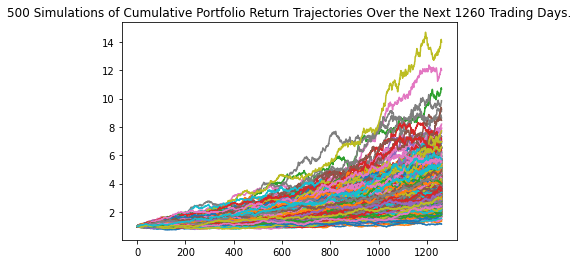

In [13]:
# Plot simulation outcomes
line_plot = MC_fiveyear.plot_simulation()

# Save the plot for future usage
line_plot.get_figure().savefig("MC_fiveyear_sim_plot.png", bbox_inches="tight")

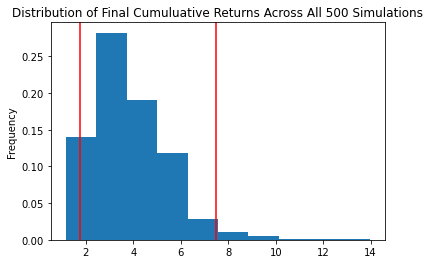

In [14]:
# Plot probability distribution and confidence intervals
dist_plot = MC_fiveyear.plot_distribution()

# Save the plot for future usage
dist_plot.get_figure().savefig('MC_fiveyear_dist_plot.png',bbox_inches='tight')

In [15]:
# Fetch summary statistics from the Monte Carlo simulation results
tbl = MC_fiveyear.summarize_cumulative_return()

# Print summary statistics
print(tbl)

count           500.000000
mean              3.856672
std               1.594854
min               1.151494
25%               2.677936
50%               3.589713
75%               4.686911
max              13.978655
95% CI Lower      1.746569
95% CI Upper      7.480996
Name: 1260, dtype: float64


In [16]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Coca-Cola and Microsoft stocks
ci_lower = round(tbl[8]*10000,2)
ci_upper = round(tbl[9]*10000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $10,000 in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

There is a 95% chance that an initial investment of $10,000 in the portfolio over the next 5 years will end within in the range of $17465.69 and $74809.96
